## Importing Libraries

In [69]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import scipy as stats
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC

from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.model_selection import cross_val_score

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [70]:
pd.set_option('Display.max_columns',None)

In [71]:
#loading the dataset
df=pd.read_csv(r'https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv')
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [72]:
#checking dimension of dataset
df.shape

(1000, 40)

In [73]:
#fetching information of dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [74]:
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

In [75]:
#finding the null value from the dataset
df.isna().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

from above null value we see _c39 have 1000 NaN.so we are removing this column

In [76]:
df.drop(['_c39','policy_number'],axis=1,inplace=True)

In [77]:
df.shape

(1000, 38)

### Heatmap to see null

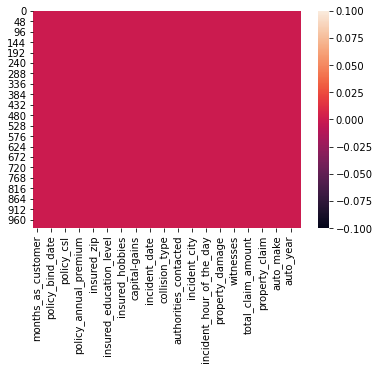

In [78]:
#heatmap to see null values
sns.heatmap(df.isnull())
plt.show()

In [79]:
#checking the unique value in each column
df.nunique()

months_as_customer              391
age                              46
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage                   3
bodily_injuries             

In [80]:
#checking value count of each columns
for i in df.columns:
    print(i)
    print(df[i].value_counts())
    print('*'*25)

months_as_customer
194    8
254    7
210    7
101    7
140    7
      ..
312    1
62     1
309    1
308    1
0      1
Name: months_as_customer, Length: 391, dtype: int64
*************************
age
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
35    32
44    32
36    32
42    32
28    30
45    26
26    26
48    25
47    24
27    24
57    16
55    14
25    14
49    14
50    13
53    13
24    10
54    10
61    10
51     9
60     9
56     8
58     8
23     7
21     6
59     5
52     4
62     4
63     2
64     2
20     1
22     1
19     1
Name: age, dtype: int64
*************************
policy_bind_date
01-01-2006    3
28-04-1992    3
05-08-1992    3
19-09-1995    2
05-01-1992    2
             ..
10-03-1997    1
23-08-2005    1
20-02-2001    1
07-03-2008    1
04-06-2012    1
Name: policy_bind_date, Length: 951, dtype: int64
*************************
policy_state
OH    352
IL    338
IN    310
Name: policy_state, dtyp

In [81]:
df.drop('umbrella_limit',axis=1,inplace=True)

removed umbrella limit column as it contain maximum count for zeros

In [82]:
#checking columns contain ? sign
df[df.columns[(df=='?').any()]].nunique()

collision_type             4
property_damage            3
police_report_available    3
dtype: int64

In [83]:
df['collision_type']=df['collision_type'].replace('?','Rear Collision')

In [84]:
df['collision_type'].value_counts()

Rear Collision     470
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64

In [85]:
df['property_damage']=df['property_damage'].replace('?','NO')
df['police_report_available']=df['police_report_available'].replace('?','NO')

In [86]:
df['property_damage'].value_counts()

NO     698
YES    302
Name: property_damage, dtype: int64

In [87]:
df['police_report_available'].value_counts()

NO     686
YES    314
Name: police_report_available, dtype: int64

In [88]:
# Converting Date columns from object type into datetime data type
df['policy_bind_date']=pd.to_datetime(df['policy_bind_date'])
df["policy_bind_Day"] = df['policy_bind_date'].dt.day
df["policy_bind_Month"] = df['policy_bind_date'].dt.month
df["policy_bind_Year"] = df['policy_bind_date'].dt.year

In [89]:
df['incident_date'] = pd.to_datetime(df['incident_date'], errors = 'coerce')

# extracting days and month from date
df['incident_month'] = df['incident_date'].dt.month
df['incident_day'] = df['incident_date'].dt.day

In [90]:
#dropping policy bind date and incident date as we converted them to day month and year
df.drop(['policy_bind_date','incident_date'],axis=1,inplace=True)

In [91]:
df['policy_state'] = df['policy_state'].replace(('IL','IN','OH'),(0,1,2))

In [92]:
df['incident_state'] = df['incident_state'].replace(('WV','NY','VA','PA','SC','NC','OH'),
                                                        (0,1,2,3,4,5,6))


In [93]:
#Separating categorical columnd
cat_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        cat_col.append(i)
cat_col        

['policy_csl',
 'insured_sex',
 'insured_education_level',
 'insured_occupation',
 'insured_hobbies',
 'insured_relationship',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'incident_city',
 'incident_location',
 'property_damage',
 'police_report_available',
 'auto_make',
 'auto_model',
 'fraud_reported']

In [94]:
# Separating numerical columns from the dataset
num_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        num_col.append(i)
num_col

['months_as_customer',
 'age',
 'policy_state',
 'policy_deductable',
 'policy_annual_premium',
 'insured_zip',
 'capital-gains',
 'capital-loss',
 'incident_state',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'bodily_injuries',
 'witnesses',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim',
 'auto_year',
 'policy_bind_Day',
 'policy_bind_Month',
 'policy_bind_Year',
 'incident_month',
 'incident_day']

In [95]:
#Statistical information
df.describe()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_zip,capital-gains,capital-loss,incident_state,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_month,incident_day
count,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000
mean,203.954000,38.948000,1.01400,1136.000000,1256.406150,501214.488000,25126.100000,-26793.700000,2.252000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000,15.448000,6.559000,2001.604000,3.407000,13.08400
std,115.113174,9.140287,0.83096,611.864673,244.167395,71701.610941,27872.187708,28104.096686,1.857403,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861,8.850176,3.391758,7.360391,3.276291,10.44318
min,0.000000,19.000000,0.00000,500.000000,433.330000,430104.000000,0.000000,-111100.000000,0.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000,1.000000,1.000000,1990.000000,1.000000,1.00000
25%,115.750000,32.000000,0.00000,500.000000,1089.607500,448404.500000,0.000000,-51500.000000,1.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000,8.000000,4.000000,1995.000000,1.000000,2.00000
50%,199.500000,38.000000,1.00000,1000.000000,1257.200000,466445.500000,0.000000,-23250.000000,2.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000,16.000000,7.000000,2002.000000,2.000000,15.00000
75%,276.250000,44.000000,2.00000,2000.000000,1415.695000,603251.000000,51025.000000,0.000000,4.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000,23.000000,9.000000,2008.000000,5.000000,22.00000
max,479.000000,64.000000,2.00000,2000.000000,2047.590000,620962.000000,100500.000000,0.000000,6.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000,31.000000,12.000000,2015.000000,12.000000,31.00000


## Univariate Analysis

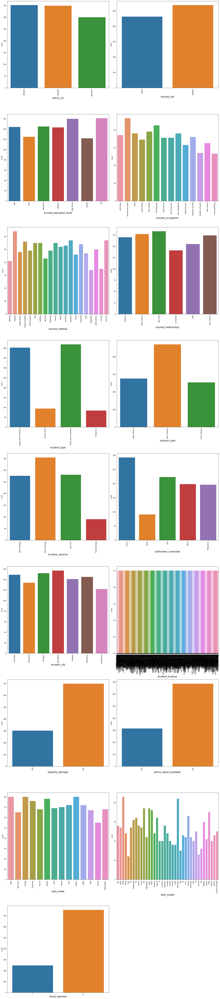

In [96]:
#Visualize the Categorical column data
plt.figure(figsize=(20,100))
plotnum=1
for i in cat_col:
    if plotnum<=20:
        ax=plt.subplot(10,2,plotnum)
        sns.countplot(df[i])
        plt.xticks(rotation=90)
        plt.xlabel(i,fontsize=15)
    plotnum+=1

plt.tight_layout()

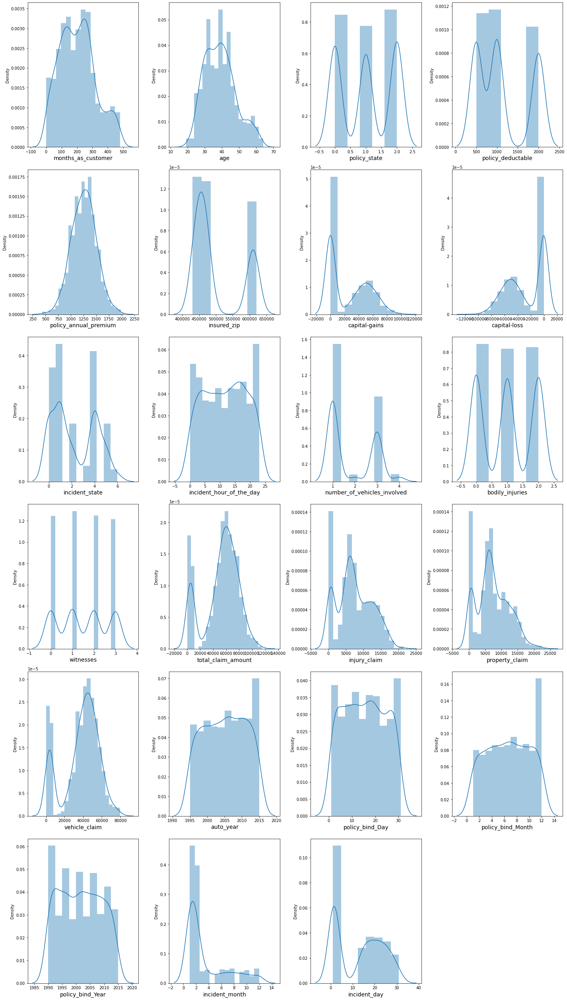

In [97]:
plt.figure(figsize=(20,35))
plotnum=1
for j in num_col:
    if plotnum<=24:
        ax=plt.subplot(6,4,plotnum)
        sns.distplot(df[j])
        plt.xlabel(j,fontsize=14)
    plotnum+=1
plt.tight_layout()  

From above plot we see data is normally distributed in most of the columns capital gain and capital loss

<AxesSubplot:xlabel='policy_state', ylabel='count'>

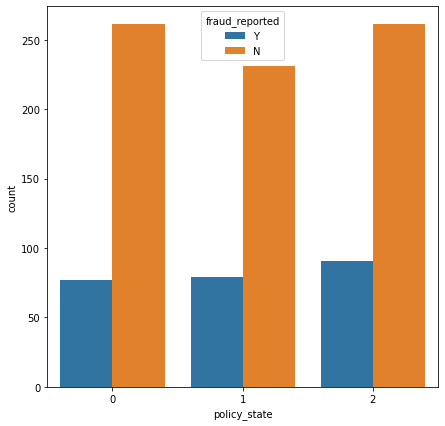

In [98]:
plt.figure(figsize=(7,7))
sns.countplot(df['policy_state'],hue='fraud_reported',data=df)

the value count for OH and IL type is same as compared to least one.Among all about 11% percent claim reported as fraud claim

<AxesSubplot:xlabel='policy_csl', ylabel='count'>

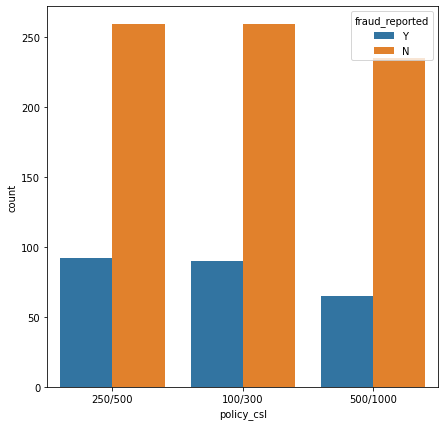

In [99]:
plt.figure(figsize=(7,7))
sns.countplot(df['policy_csl'],hue='fraud_reported',data=df)

Here we see in 250/500 and 100/300 value count 90 customers reported as fraud claim

<AxesSubplot:xlabel='policy_deductable', ylabel='count'>

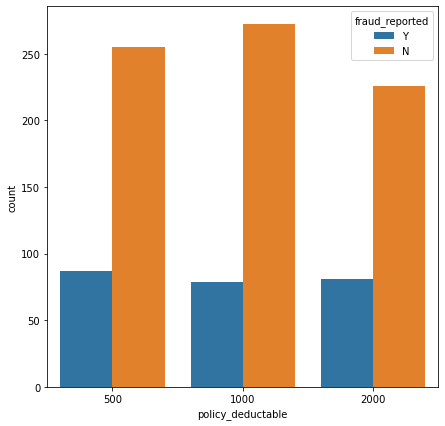

In [100]:
plt.figure(figsize=(7,7))
sns.countplot(df['policy_deductable'],hue='fraud_reported',data=df)

<AxesSubplot:xlabel='insured_sex', ylabel='count'>

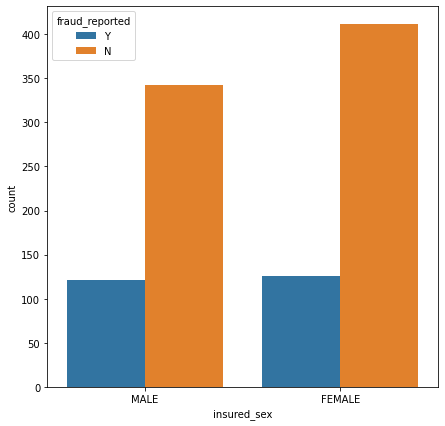

In [101]:
plt.figure(figsize=(7,7))
sns.countplot(df['insured_sex'],hue='fraud_reported',data=df)

Most of the male and female claim is not counted in  fraud as 120 customer reported for fraud claim

<AxesSubplot:xlabel='insured_education_level', ylabel='count'>

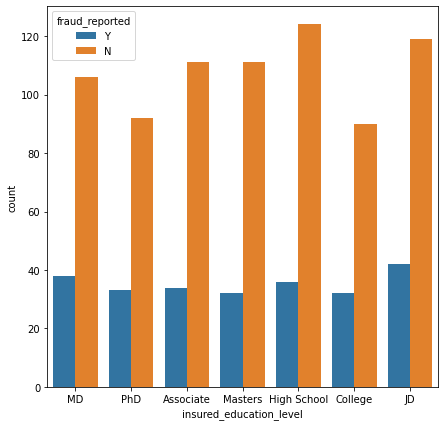

In [102]:
plt.figure(figsize=(7,7))
sns.countplot(df['insured_education_level'],hue='fraud_reported',data=df)

Fraud level is less who have high school education and the people who have completed their JD education have high fraud report. The people who have high insured education are facing insurance fraud as  compared to people with less education level.

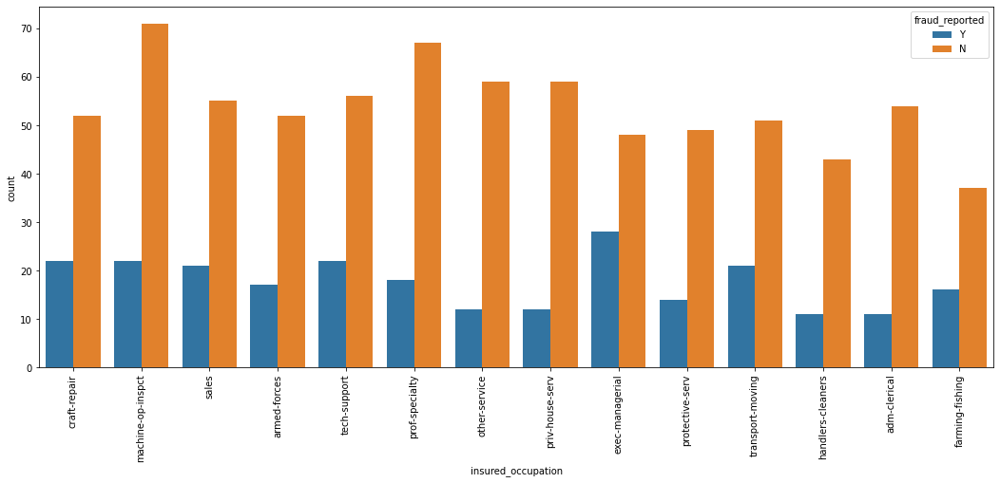

In [103]:
plt.figure(figsize=(18,7))
sns.countplot(df['insured_occupation'],hue='fraud_reported',data=df)
plt.xticks(rotation=90)
plt.show()

 people positioning  with exec-managerials have high fraud reports compared to others.

<AxesSubplot:xlabel='insured_relationship', ylabel='count'>

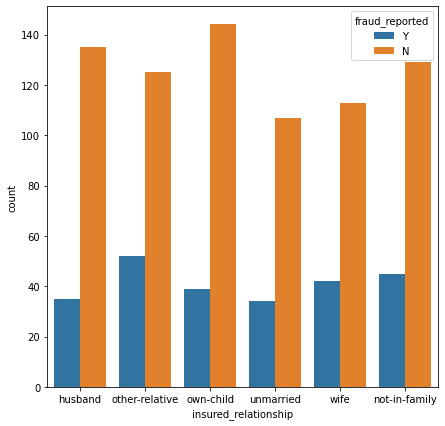

In [104]:
plt.figure(figsize=(7,7))
sns.countplot(df['insured_relationship'],hue='fraud_reported',data=df)

<AxesSubplot:xlabel='incident_type', ylabel='count'>

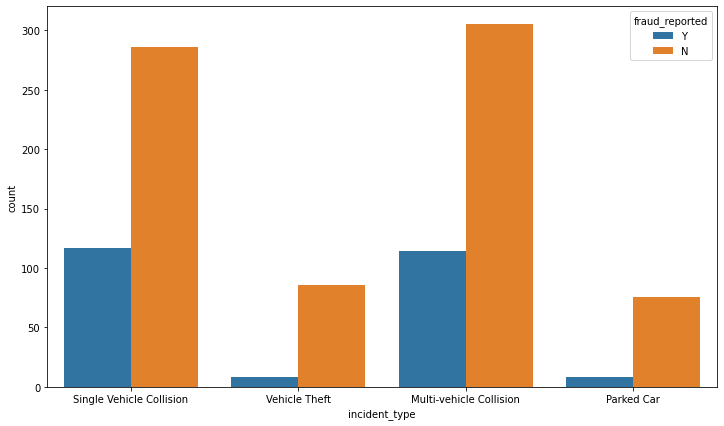

In [105]:
plt.figure(figsize=(12,7))
sns.countplot(df['incident_type'],hue='fraud_reported',data=df)

Multivehicle collission and single vehicle collision, the fraud report is very high compared to others

<AxesSubplot:xlabel='collision_type', ylabel='count'>

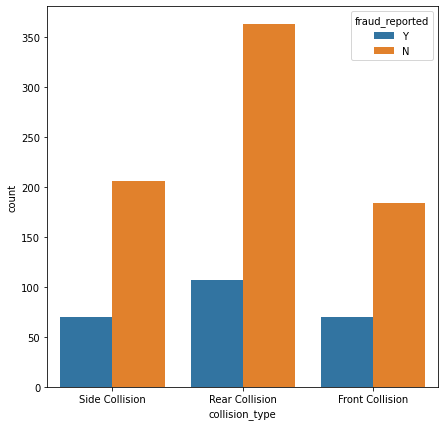

In [106]:
plt.figure(figsize=(7,7))
sns.countplot(df['collision_type'],hue='fraud_reported',data=df)

Fraud level is high in the collision type Rear Collision and other two collision type have average reports.

<AxesSubplot:xlabel='incident_severity', ylabel='count'>

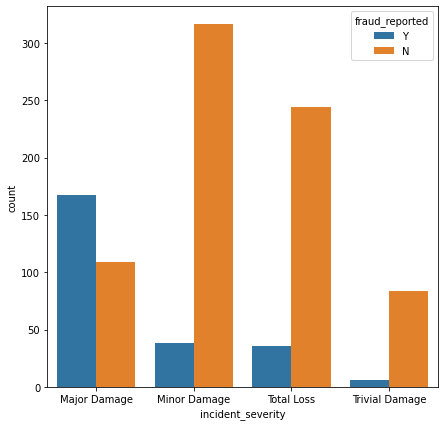

In [107]:
plt.figure(figsize=(7,7))
sns.countplot(df['incident_severity'],hue='fraud_reported',data=df)

Fraud report is high in Major damage incident severity and for Trivial Damage the report is less compared to others.

<AxesSubplot:xlabel='incident_state', ylabel='count'>

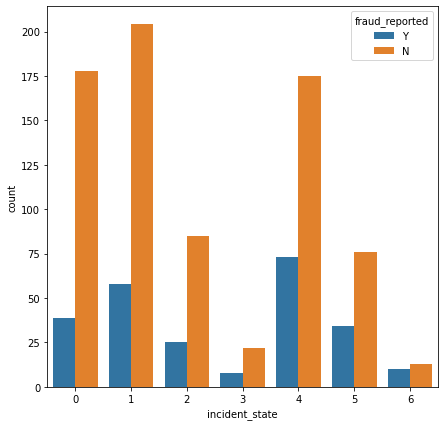

In [108]:
plt.figure(figsize=(7,7))
sns.countplot(df['incident_state'],hue='fraud_reported',data=df)

SC state have high fraud count as compared to others.

<AxesSubplot:xlabel='incident_city', ylabel='count'>

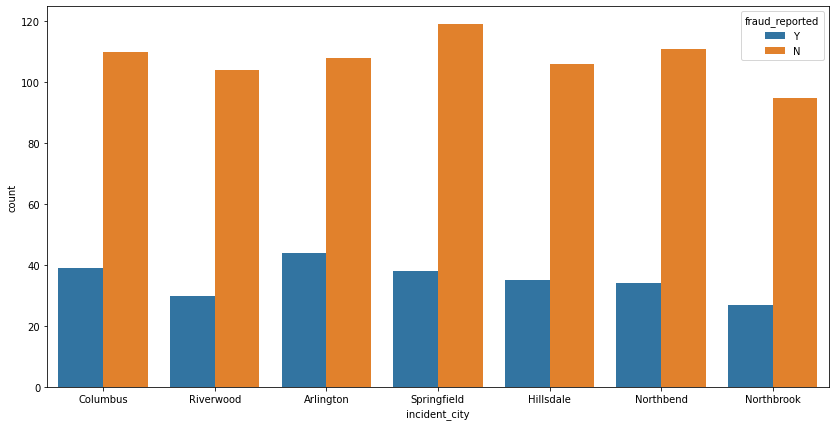

In [109]:
plt.figure(figsize=(14,7))
sns.countplot(df['incident_city'],hue='fraud_reported',data=df)

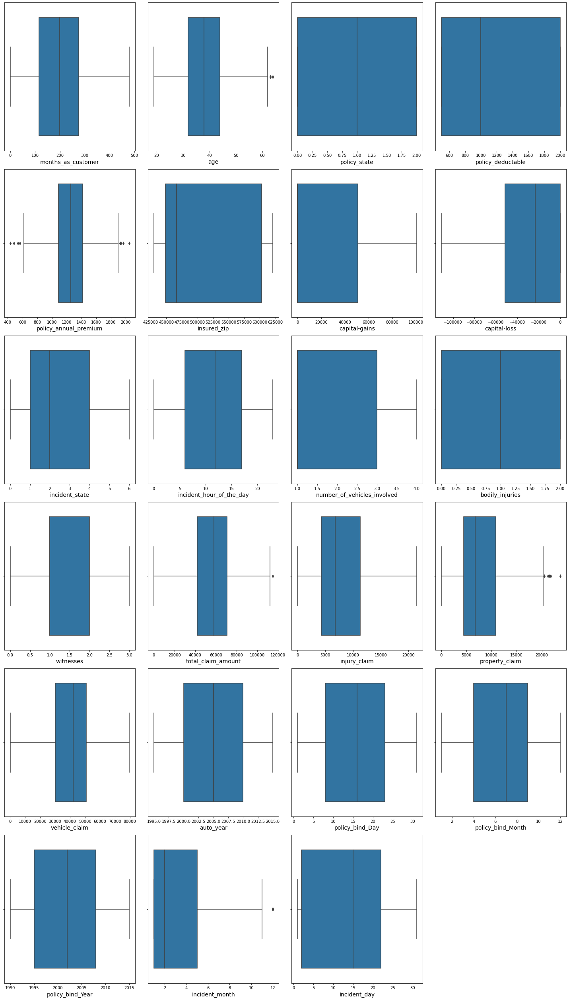

In [110]:
#vISUALIZAING HOW DATA IS DISTRIBUTED USING BOXPLOT
plt.figure(figsize=(20,35))
plotnum=1
for j in num_col:
    if plotnum<=24:
        ax=plt.subplot(6,4,plotnum)
        sns.boxplot(df[j])
        plt.xlabel(j,fontsize=14)
    plotnum+=1
plt.tight_layout()

## Multivariate Analysis

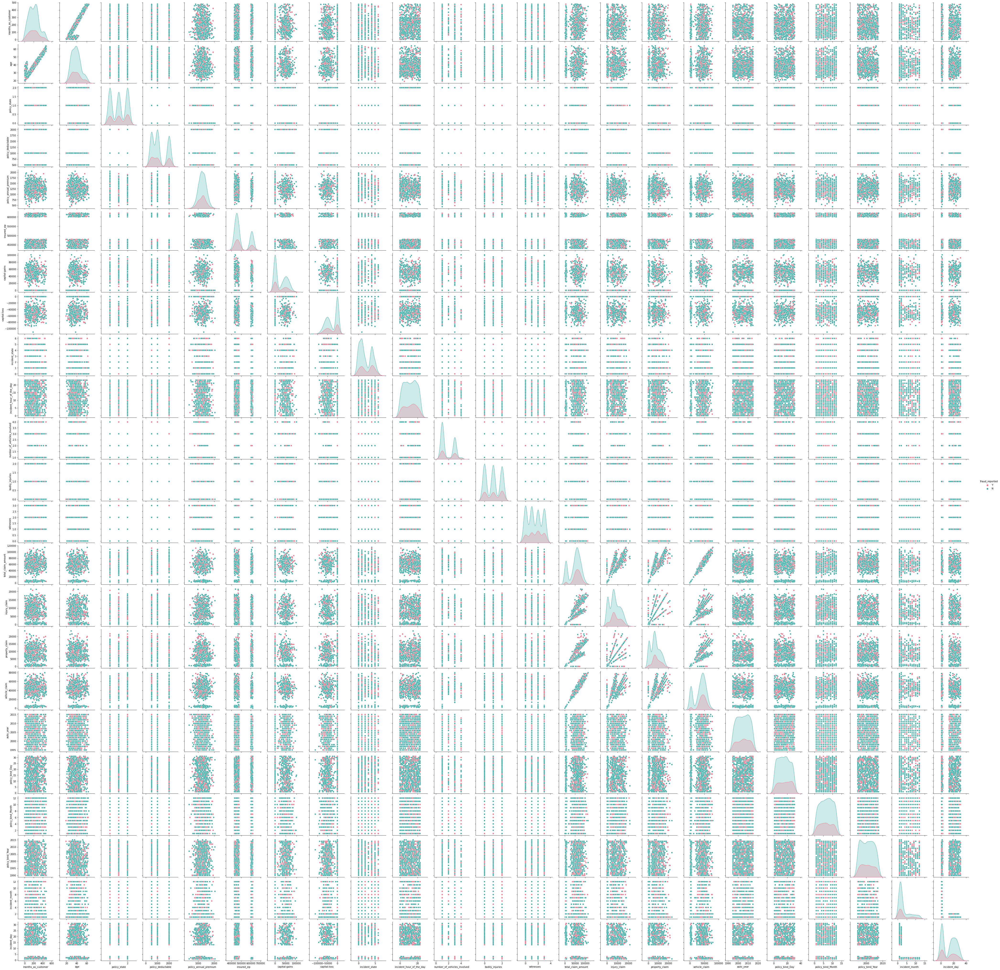

In [43]:
sns.pairplot(df,hue="fraud_reported",palette="husl")
plt.show()

In [111]:
#CORREATION MATRIX
df.corr()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_zip,capital-gains,capital-loss,incident_state,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_month,incident_day
months_as_customer,1.000000,0.922098,-0.000328,0.026807,0.005018,0.017895,0.006399,0.020209,-0.038963,0.070639,0.014736,-0.010162,0.058383,0.062108,0.065329,0.034940,0.061013,-0.000292,0.051728,0.005750,-0.048276,0.024659,-0.011092
age,0.922098,1.000000,-0.014533,0.029188,0.014404,0.025604,-0.007075,0.007368,-0.033071,0.087161,0.022102,-0.015679,0.052359,0.069863,0.075522,0.060898,0.062588,0.001354,0.053869,0.015501,-0.037444,0.023404,-0.006131
policy_state,-0.000328,-0.014533,1.000000,0.010033,0.012455,0.008777,0.074551,-0.030338,0.028843,0.029457,-0.042263,0.013384,0.022960,-0.006002,-0.046290,0.008406,0.001425,0.002114,0.002277,0.071450,-0.007276,0.023643,0.014745
policy_deductable,0.026807,0.029188,0.010033,1.000000,-0.003245,0.004545,0.035212,-0.023544,-0.013892,0.060935,0.051214,-0.022765,0.066639,0.022839,0.039107,0.064792,0.005269,0.026105,0.009164,-0.050416,-0.049598,-0.006418,-0.018160
policy_annual_premium,0.005018,0.014404,0.012455,-0.003245,1.000000,0.032354,-0.013738,0.023547,-0.057239,-0.001578,-0.045991,0.026780,0.002332,0.009094,-0.017633,-0.011654,0.020246,-0.049226,-0.025183,-0.035355,0.001249,0.021559,0.014835
insured_zip,0.017895,0.025604,0.008777,0.004545,0.032354,1.000000,0.006303,0.049372,0.025160,0.008274,0.027448,0.028695,0.019805,-0.033873,-0.017495,-0.006841,-0.041083,-0.032736,-0.039867,0.015864,-0.001100,0.005461,0.019095
capital-gains,0.006399,-0.007075,0.074551,0.035212,-0.013738,0.006303,1.000000,-0.046904,0.022076,-0.016406,0.061643,0.055829,-0.017651,0.015980,0.025934,-0.000779,0.015836,0.031398,0.007994,-0.011102,0.041249,0.029409,0.015418
capital-loss,0.020209,0.007368,-0.030338,-0.023544,0.023547,0.049372,-0.046904,1.000000,0.031781,-0.025054,-0.014895,-0.024418,-0.041330,-0.036060,-0.046060,-0.022863,-0.032665,-0.056615,-0.038297,0.003436,-0.026420,0.023216,-0.015035
incident_state,-0.038963,-0.033071,0.028843,-0.013892,-0.057239,0.025160,0.022076,0.031781,1.000000,0.022228,0.009823,0.014467,0.006438,-0.009350,-0.019316,-0.002181,-0.007522,0.015950,0.034412,0.021154,0.042599,0.030338,-0.029372
incident_hour_of_the_day,0.070639,0.087161,0.029457,0.060935,-0.001578,0.008274,-0.016406,-0.025054,0.022228,1.000000,0.120794,-0.034563,0.006527,0.217702,0.165768,0.179536,0.215626,0.021368,-0.009511,-0.000934,0.035412,0.044827,-0.027965


## HEATMAP

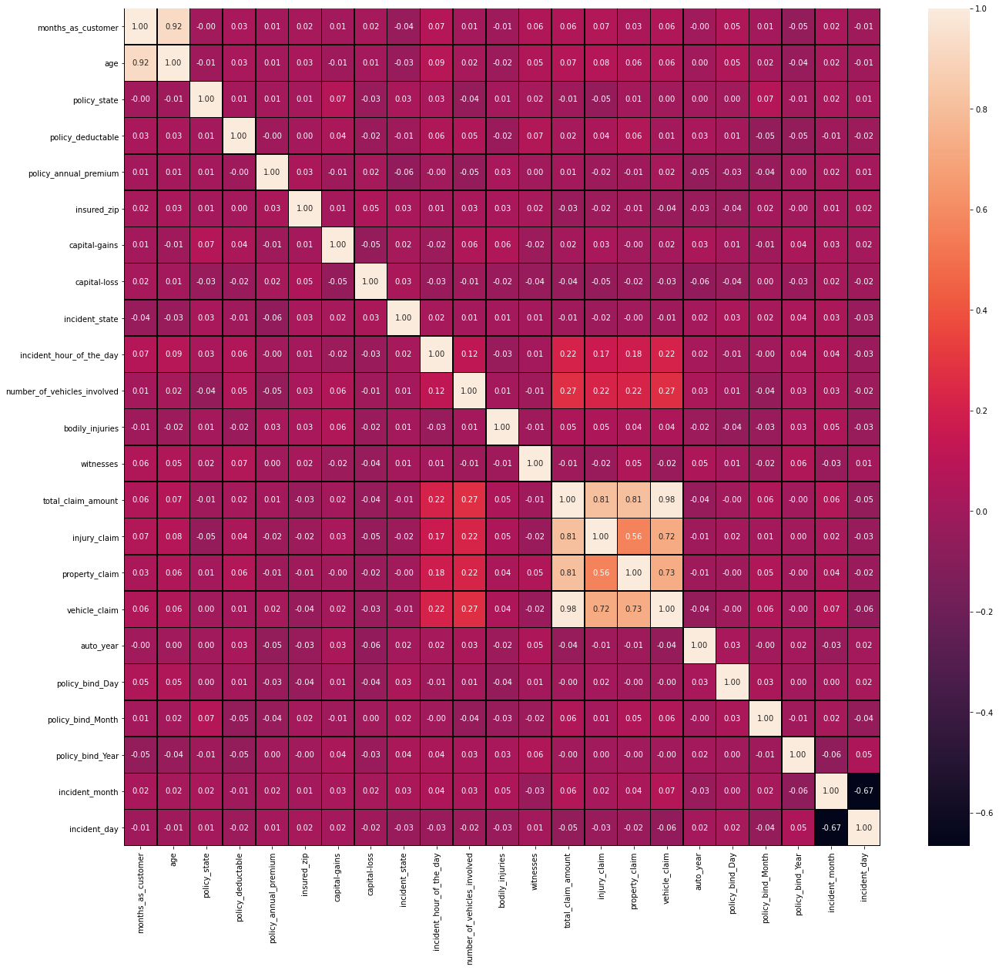

In [112]:
plt.figure(figsize=(22,20))
sns.heatmap(df.corr(),annot=True,linewidth=0.5,linecolor='black',fmt='.2f')
plt.show()

## Zscore for removing outliers

In [131]:
# Using zscore to remove outliers
from scipy.stats import zscore

# Feature containing outliers
features = df[['age','policy_annual_premium','total_claim_amount','property_claim','incident_month']]
z=np.abs(zscore(features))
threshold=3
df_new=df[(z<3).all(axis=1)]

In [132]:
df_new.shape

(995, 40)

In [133]:
loss=(1000-996)/1000*100
loss

0.4

In [134]:
df=df_new.copy()

In [135]:
df_new.skew()

months_as_customer             0.359045
age                            0.475670
policy_state                  -0.030057
policy_csl                     0.094874
policy_deductable              0.471759
policy_annual_premium          0.032800
insured_zip                    0.829085
insured_sex                    0.143294
insured_education_level        0.000307
insured_occupation            -0.065304
insured_hobbies               -0.059828
insured_relationship           0.074525
capital-gains                  0.477212
capital-loss                  -0.391351
incident_type                  0.104817
collision_type                -0.033901
incident_severity              0.274370
authorities_contacted         -0.122469
incident_state                 0.295054
incident_city                  0.045289
incident_location              0.001225
incident_hour_of_the_day      -0.037487
number_of_vehicles_involved    0.498701
property_damage                0.855977
bodily_injuries                0.012979


## Label Encoding

In [136]:
from sklearn.preprocessing import LabelEncoder

LE=LabelEncoder()
df[cat_col]=df[cat_col].apply(LE.fit_transform)
df[cat_col].head()

,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_city,incident_location,property_damage,police_report_available,auto_make,auto_model,fraud_reported
0,1,1,4,2,17,0,2,2,0,4,1,991,1,1,10,1,1
1,1,1,4,6,15,2,3,1,1,4,5,625,0,0,8,12,1
2,0,0,6,11,2,3,0,1,1,4,1,682,0,0,4,30,0
3,1,0,6,1,2,4,2,0,0,4,0,666,0,0,3,34,1
4,2,1,0,11,2,4,3,1,1,2,0,219,0,0,0,31,0


## splitting the train and test data into x and y variable

In [137]:
x=df.drop('fraud_reported',axis=1)
y=df['fraud_reported']

In [138]:
x.shape

(995, 39)

In [139]:
y.shape

(995,)

In [140]:
from imblearn.over_sampling import SMOTE

## Standard Scaling

In [141]:
sc=StandardScaler()
x=pd.DataFrame(sc.fit_transform(x),columns=x.columns)
x.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_month,incident_day
0,1.073785,0.987232,1.185197,0.064997,-0.225779,0.621343,-0.485558,1.074095,0.529910,-1.164295,1.283015,-1.436748,1.009158,0.954679,0.766281,1.343026,-1.262662,1.196009,0.944147,-0.966355,1.719866,-0.958574,-0.825624,1.514827,0.008593,0.466200,1.479562,0.717086,-0.188099,1.182263,0.750980,0.856689,-1.645860,-0.183978,0.176916,1.013379,1.685033,-0.735869,1.139984
1,0.203534,0.330763,-0.019370,0.064997,1.408038,-0.250995,-0.456971,1.074095,0.529910,-0.167759,0.930607,-0.247427,-0.901791,0.954679,1.690462,-0.030366,-0.198861,1.196009,-0.133177,0.991941,0.445633,-0.526804,-0.825624,-0.660141,-1.212826,-1.335233,-0.675876,-1.807209,-1.362387,-1.379504,-1.822887,0.360672,-0.658470,0.315271,1.308227,-0.165933,0.598883,-0.735869,0.756683
2,-0.614502,-1.091585,1.185197,-1.178689,1.408038,0.647261,-0.982050,-0.931017,1.556707,1.077912,-1.360049,0.347234,0.356639,0.954679,-1.082081,-0.030366,-0.198861,1.196009,-0.671839,-0.966355,0.644080,-0.670727,1.137330,-0.660141,1.230012,1.366916,-0.675876,-0.685047,0.055776,-0.736970,-0.784756,-0.631363,0.957258,0.315271,-0.728132,-0.165933,-0.215729,-0.430536,0.852508
3,0.447204,0.221352,-1.223937,0.064997,1.408038,0.658077,1.500200,-0.931017,1.556707,-1.413430,-1.360049,0.941895,0.851406,-1.268231,0.766281,-1.403759,-1.262662,1.196009,2.021472,-1.455929,0.588375,-0.958574,-0.825624,-0.660141,0.008593,0.466200,-0.675876,0.405627,-0.222938,-0.215826,0.678909,-0.879372,1.316309,1.480184,1.081965,-0.460762,-1.573416,2.012132,-1.159824
4,0.203534,0.549586,-1.223937,1.308683,-0.225779,1.357686,1.536409,1.074095,-1.523685,1.077912,-1.360049,0.941895,1.464487,-0.684004,1.690462,-0.030366,-0.198861,-0.109563,-0.671839,-1.455929,-0.967860,1.200279,-0.825624,-0.660141,-1.212826,-0.434516,-0.675876,-1.752960,-1.255820,-1.406713,-1.767775,-1.623398,1.047021,0.648103,-1.067525,-0.165933,1.685033,-0.430536,0.373382


## Variance Inflation Factor

In [142]:
# Finding VIF in each scaled column i.e, x.shape[1] (1/(1-R2))

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif["Features"] = x.columns
vif

,VIF values,Features
0,6.978572,months_as_customer
1,6.989927,age
2,1.040383,policy_state
3,1.033689,policy_csl
4,1.045848,policy_deductable
5,1.040695,policy_annual_premium
6,1.028654,insured_zip
7,1.030783,insured_sex
8,1.049085,insured_education_level
9,1.022921,insured_occupation


In [143]:
# Dropping total_claim_amount column as it contains high VIF value
x.drop(["total_claim_amount"],axis=1,inplace=True)

In [144]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,6.978572,months_as_customer
1,6.989927,age
2,1.040383,policy_state
3,1.033689,policy_csl
4,1.045848,policy_deductable
5,1.040695,policy_annual_premium
6,1.028654,insured_zip
7,1.030783,insured_sex
8,1.049085,insured_education_level
9,1.022921,insured_occupation


### label is imbalanced so we are going to balance it using SMOTE

In [145]:
sm=SMOTE()
x,y=sm.fit_resample(x,y)

In [146]:
y.value_counts()

0    750
1    750
Name: fraud_reported, dtype: int64

In [147]:
from sklearn.metrics import accuracy_score

## Model Building

In [151]:
max_acc=0
max_rs=0
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    lr=LogisticRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc > max_acc:
        max_acc=acc
        max_rs=i
print('Best accuracy score is',max_acc,'on random state',max_rs)

Best accuracy score is 0.8 on random state 15


In [154]:
def classifier(model,x,y):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=15)
    
    model.fit(x_train,y_train)
    
    pred=model.predict(x_test)
    
    print('Accuracy Score:',accuracy_score(y_test, pred)*100)
    print('Cross validation score:',cross_val_score(model,x,y,cv=5).mean()*100)
    print('Confusion matrix:\n',confusion_matrix(y_test, pred))
    print('Classification report:\n',classification_report(y_test,pred))

In [155]:
model=LogisticRegression()
classifier(model,x,y)

Accuracy Score: 80.0
Cross validation score: 75.73333333333333
Confusion matrix:
 [[120  34]
 [ 26 120]]
Classification report:
               precision    recall  f1-score   support

           0       0.82      0.78      0.80       154
           1       0.78      0.82      0.80       146

    accuracy                           0.80       300
   macro avg       0.80      0.80      0.80       300
weighted avg       0.80      0.80      0.80       300



In [156]:
model=RandomForestClassifier()
classifier(model,x,y)

Accuracy Score: 91.0
Cross validation score: 88.26666666666667
Confusion matrix:
 [[139  15]
 [ 12 134]]
Classification report:
               precision    recall  f1-score   support

           0       0.92      0.90      0.91       154
           1       0.90      0.92      0.91       146

    accuracy                           0.91       300
   macro avg       0.91      0.91      0.91       300
weighted avg       0.91      0.91      0.91       300



In [157]:
model=DecisionTreeClassifier()
classifier(model,x,y)

Accuracy Score: 83.33333333333334
Cross validation score: 83.06666666666666
Confusion matrix:
 [[124  30]
 [ 20 126]]
Classification report:
               precision    recall  f1-score   support

           0       0.86      0.81      0.83       154
           1       0.81      0.86      0.83       146

    accuracy                           0.83       300
   macro avg       0.83      0.83      0.83       300
weighted avg       0.84      0.83      0.83       300



In [158]:
model=GradientBoostingClassifier()
classifier(model,x,y)

Accuracy Score: 88.33333333333333
Cross validation score: 87.80000000000001
Confusion matrix:
 [[134  20]
 [ 15 131]]
Classification report:
               precision    recall  f1-score   support

           0       0.90      0.87      0.88       154
           1       0.87      0.90      0.88       146

    accuracy                           0.88       300
   macro avg       0.88      0.88      0.88       300
weighted avg       0.88      0.88      0.88       300



In [159]:
model=KNeighborsClassifier()
classifier(model,x,y)

Accuracy Score: 62.0
Cross validation score: 66.13333333333333
Confusion matrix:
 [[ 46 108]
 [  6 140]]
Classification report:
               precision    recall  f1-score   support

           0       0.88      0.30      0.45       154
           1       0.56      0.96      0.71       146

    accuracy                           0.62       300
   macro avg       0.72      0.63      0.58       300
weighted avg       0.73      0.62      0.58       300



In [160]:
model=SVC()
classifier(model,x,y)

Accuracy Score: 90.0
Cross validation score: 87.20000000000002
Confusion matrix:
 [[139  15]
 [ 15 131]]
Classification report:
               precision    recall  f1-score   support

           0       0.90      0.90      0.90       154
           1       0.90      0.90      0.90       146

    accuracy                           0.90       300
   macro avg       0.90      0.90      0.90       300
weighted avg       0.90      0.90      0.90       300



In [161]:
from sklearn.ensemble import AdaBoostClassifier, BaggingClassifier

In [162]:
model= AdaBoostClassifier()
classifier(model,x,y)

Accuracy Score: 85.33333333333334
Cross validation score: 82.93333333333332
Confusion matrix:
 [[134  20]
 [ 24 122]]
Classification report:
               precision    recall  f1-score   support

           0       0.85      0.87      0.86       154
           1       0.86      0.84      0.85       146

    accuracy                           0.85       300
   macro avg       0.85      0.85      0.85       300
weighted avg       0.85      0.85      0.85       300



In [163]:
model= BaggingClassifier()
classifier(model,x,y)

Accuracy Score: 86.66666666666667
Cross validation score: 86.93333333333332
Confusion matrix:
 [[132  22]
 [ 18 128]]
Classification report:
               precision    recall  f1-score   support

           0       0.88      0.86      0.87       154
           1       0.85      0.88      0.86       146

    accuracy                           0.87       300
   macro avg       0.87      0.87      0.87       300
weighted avg       0.87      0.87      0.87       300



In [164]:
from xgboost import XGBClassifier 
model= XGBClassifier()
classifier(model,x,y)

[14:23:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy Score: 90.0
[14:23:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:23:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:23:53] WARNING: C:/Users/Administrator/worksp

In [165]:
from sklearn.ensemble import ExtraTreesClassifier
model= ExtraTreesClassifier()
classifier(model,x,y)

Accuracy Score: 91.66666666666666
Cross validation score: 91.20000000000002
Confusion matrix:
 [[139  15]
 [ 10 136]]
Classification report:
               precision    recall  f1-score   support

           0       0.93      0.90      0.92       154
           1       0.90      0.93      0.92       146

    accuracy                           0.92       300
   macro avg       0.92      0.92      0.92       300
weighted avg       0.92      0.92      0.92       300



# Hyper parameter tuning on the best Classification ML Model

In [166]:
# ExtraTrees Classifier
from sklearn.model_selection import GridSearchCV

param = {'criterion' : ['gini','entropy'],'max_features':['auto','sqrt','log2'],'max_depth' : [10,20,30,40,50],
              'n_jobs' : [-2, -1, 1],'n_estimators' : [100, 200, 300,500,700]}


In [167]:
GSCV=GridSearchCV(ExtraTreesClassifier(),param,cv=5)
GSCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 20, 30, 40, 50],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [100, 200, 300, 500, 700],
                         'n_jobs': [-2, -1, 1]})

In [199]:
#finding best parameters for our mmodel
GSCV.best_params_

{'criterion': 'entropy',
 'max_depth': 50,
 'max_features': 'log2',
 'n_estimators': 100,
 'n_jobs': 1}

In [202]:
Final_Model=ExtraTreesClassifier(criterion='entropy',max_depth=50,max_features='log2',n_estimators=100,n_jobs=1)
Final_Model.fit(x_train,y_train)
pred=Final_Model.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

92.0


### we have sucessufully incorported our final model with the accuracy score of 92.00%

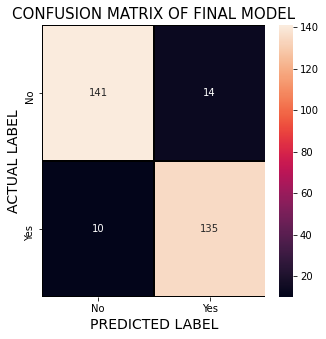

In [203]:
#COnfusion matrix for Final Model
Conf_mat=confusion_matrix(y_test,pred)
x_axis=['No','Yes']
y_axis=['No','Yes']

f,ax=plt.subplots(figsize=(5,5))
sns.heatmap(Conf_mat,annot=True,linewidths=0.5,linecolor='black',fmt='.0f',ax=ax, xticklabels=x_axis,yticklabels=y_axis)

plt.xlabel('PREDICTED LABEL',fontsize=14)
plt.ylabel('ACTUAL LABEL',fontsize=14)
plt.title('CONFUSION MATRIX OF FINAL MODEL',fontsize=15)
plt.show()

from Confusion matrix we able to find actual and predicted values

In [204]:
from sklearn import datasets
from sklearn import metrics,model_selection
from sklearn.metrics import plot_roc_curve

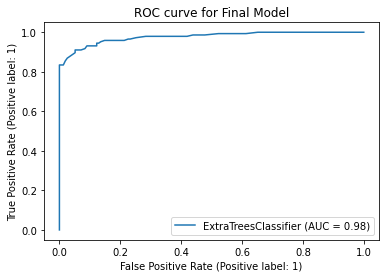

In [205]:
# Let's check the Auc for the best model after hyper parameter tuning
plot_roc_curve(Final_Model, x_test, y_test)
plt.title("ROC curve for Final Model")
plt.show()

We plotted ROC Curve for our final model and AUC value for out ExtraTree Classifier model is 98%

In [206]:
# Saving the model using .pkl
import joblib
joblib.dump(Final_Model,"AIFC_EP10.pkl")

['AIFC_EP10.pkl']

In [207]:
#loading the saved model and get the prediction

model=joblib.load("AIFC_EP10.pkl")

prediction = model.predict(x_test)
prediction

array([1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0,
       1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0,
       1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1,
       0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1,
       0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1,
       1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1,
       0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1,
       1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1,
       1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0,
       0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1,
       1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0,
       0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1,
       1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0], d

Above are the predicted fraud claims of the customers

In [208]:
pd.DataFrame([model.predict(x_test)[:],y_test[:]],index=["Predicted","Original"]).T

,Predicted,Original
0,1,1
1,0,0
2,1,1
3,0,0
4,1,1
...,...,...
295,0,0
296,1,1
297,1,1
298,0,0


#### From above we see actual and Predicted fraud report is same.